# Biometrics System Concepts
## Assignment 2: Fingerprint and Iris based Identification

**Author:** Antonios Glioumpas |
**Date:** April 10, 2022
---

Implement and test a keypoint-based fingerprint and iris recognition system and fuse the two systems together.

A high-level description is provided with links to or hints of code snippets and libraries that you can reuse/adapt at your will (with proper referencing!).

This document is structured as below:  
* [I. Setting](#I.-Setting)
* [II. Fingerprint Recognition](#II.-Fingerprint-Recognition)
  1. Reading data
  2. Baseline model
    1. Choosing a similarity metric
    2. Constructing the similarity matrix
    3. Validation
  3. Model extension 1: local similarity¶
    1. Image enhancements
    2. Feature extraction
    3. local Keypoint Matching
    4. Local Similarity metric
    5. Construct local similarity matrix
    6. Validation
  4. Model extension 2: Global similarity
    1. Image alignment
    2. Global Similarity Metric
    3. Construct global similarity matrix
    4. Validation
  5. Model extension 3: Hybrid features
    1. Hybrid Similarity metric
    2. Construct hybrid similarity matrix
    3. Validation
  6. Solve the murder case
* [III. Iris Recognition](#III.-Iris-recognition)
  1. Reading data
  2. Biometric iris recogntion System
    1. Image enhancement
    2. Construct similarity matrix
    3. Validation
  3. Solve the murder case
* [IV. Multimodal System](#IV-Multimodal-System)
  1. Score fusion
    1. Construct similarity matrix
    2. Validation
  2. Solve the murder case  
* [V. Assignment Instructions](#V.-Assignment-Instructions)

In [1]:
#to plot figures inline
%matplotlib inline

# OpenCV package
import cv2
# Standard array processing package
import numpy as np
# Plotting library
from matplotlib import pyplot as plt
# Setting the default colormap for pyplot
import matplotlib as mpl
mpl.rc('image', cmap='gray')
# File path processing package
from pathlib import Path
# Local modules for fingerprint enhancement
import src.fprmodules.enhancement as fe
# Package for some simple biometric metrics. 
# Of course you can use the code you have developed in the previous assignment
from sklearn.metrics import roc_curve
# Pickle allows to save and read intermediate results (similar to save and load in Matlab)
import pickle

# A visual progress bar library.
# tqdm is a library in Python which is used for creating Progress Meters or Progress Bars.
from tqdm.notebook import tqdm as tqdm_notebook

# Allows us to generate markdown using python code
from IPython.display import Markdown
# Data analysis and manipulation tool
import pandas as pd
# Cartesian product of 2 iterables
from itertools import product
# Path name pattern searching
import glob
# OS interfaces
import os
# Compression interface
import zlib
# Binary encoding
from base64 import urlsafe_b64encode as b64e, urlsafe_b64decode as b64d

In [2]:
# Helper functions
def plot_image_sequence(data, n, imgs_per_row=7, figsize=(10,10), cmap='gray'):
    n_rows = 1 + int(n/(imgs_per_row+1))
    n_cols = min(imgs_per_row, n)

    f,ax = plt.subplots(n_rows,n_cols, figsize=(figsize[0]*n_cols,figsize[1]*n_rows))
    for i in range(n):
        if n == 1:
            ax.imshow(data[i], cmap=cmap)
        elif n_rows > 1:
            ax[int(i/imgs_per_row),int(i%imgs_per_row)].imshow(data[i], cmap=cmap)
        else:
            ax[int(i%n)].imshow(data[i], cmap=cmap)
    plt.show()

## <a id='I.-Setting'></a>I. Setting

Oh no! A woman is found dead in her hotel room. Multiple stab wounds in the chest indicate that it was... *MURDER!*

The police has locked down the hotel and you were brought in to assist the forensics team in finding the murderer. Your associates have reviewed the security footage and have detected a person entering the room with the victim just 15 minutes before the estimated time of death. Unfortunately, the perpetrator did their homework and they were very careful not to give away any leads that might help you identify them. They slipped however, and on their way out touched the door knob with their bare hand...

## <a id='II.-Fingerprint-Recognition'></a> II. Fingerprint Recognition

### 1. Reading data
#### *Reading the image data and converting to grayscale*

First, it is useful to visualise our data. Let's first have a look at the fingerprint that was collected from the door knob first.
We convert the data to grayscale, we're not interested in color values (and don't have them).

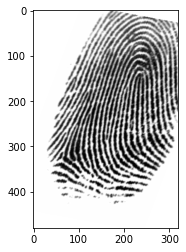

In [3]:
perpetrator_fp = cv2.imread('./perpetrator_fp.png')

'''
In Python, the assert statement is used to continue the execute if the given condition evaluates to True. 
If the assert condition evaluates to False, then it raises the AssertionError exception with the specified error message. 
'''
assert (
    (perpetrator_fp[...,0] == perpetrator_fp[...,1]).all() and
    (perpetrator_fp[...,1] == perpetrator_fp[...,2]).all()
)

perpetrator_fp = cv2.cvtColor(perpetrator_fp, cv2.COLOR_BGR2GRAY)

plt.imshow(perpetrator_fp);


Now, let's have a look at the other fingerprint data available. This data is stored in `data/NIST301/`.   
There were apparently 100 guests in the hotel at the time of murder.   
The filename indicates the subject identifier.    
Below there is a function to read and label these fingerprints.   

In [ ]:
def read_DB(path):
    images = []
    labels = []
    imagePaths = sorted(Path(path).rglob("*.png"))
    for imagePath in tqdm_notebook(imagePaths):
        image = cv2.imread(path + imagePath.name)
        if (len(image.shape) > 2):
            image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        images.append(image)
        label = imagePath.stem[0:3]
        labels.append(label)
    return (images, labels)

# Read the fingerprint database
images_db, labels_db = read_DB('data/NIST301/')

# Save some metadata
n_imgs = len(images_db)
img_height, img_width = images_db[0].shape

Markdown(f"""Here are some samples from the database, which contains {n_imgs} images of size {img_height}x{img_width}.""")

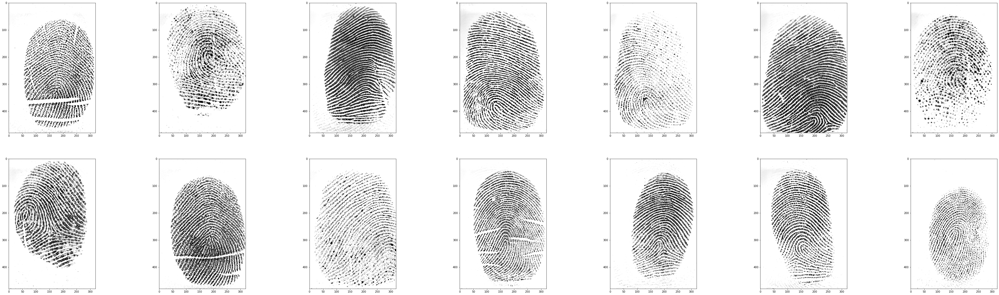

In [5]:
n = 14
plot_image_sequence(images_db,n) 

### 2. A baseline model

#### 2.1. Choosing a similarity metric
onsider the similarity function below:

In [6]:
'''
A lambda function is a small anonymous function.
A lambda function can take any number of arguments, but can only have one expression.
Use lambda functions when an anonymous function is required for a short period of time.
'''
mss = lambda x,y : 1/(1+np.square(x-y).mean())

#### 2.2. Constructing the similarity score table
Since we're not in an authentication scenario, all we can do is to calculate the similarity scores between each fingerprint in the database and the one from the perpetrator.
Once we have a metric for each image, we can just sort them and store them in a table.

In [7]:
def constructSimilarityTable(org_img,img_db, labels, dist_func):
    #dist_func is the function that computes the distance between two images (distance_function)
    data=[]
    for i,img in enumerate(img_db):
        data.append([
            labels[i],
            dist_func(org_img, img)])
    assert (len(data) == len(img_db))
    return pd.DataFrame(data, columns=['id', 'score'])

sim_tb0 = constructSimilarityTable(perpetrator_fp,images_db, labels_db, mss)

# Display similarity score dataframe showing the similarity score of each labeled image 
# from the dataset with the perpetrator's fingerprint
# distance_function = mean squared error

sim_tb0 = sim_tb0.sort_values(by='score', ascending=False)

sim_tb0

,id,score
87,088,0.017036
80,081,0.016824
41,042,0.016668
22,023,0.016646
76,077,0.016608
...,...,...
67,068,0.012278
70,071,0.012171
68,069,0.011835
77,078,0.011823


We can see that the highest match score 0.0170 
belongs to subject 088. However, subject 081 is not far behind with 
a score of 0.0168! Surely we can do a better job than that. Or can we..?

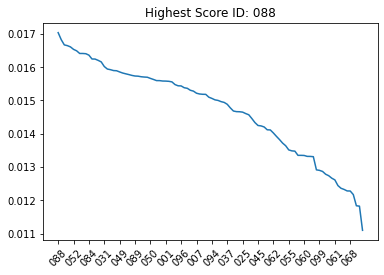

In [8]:
ids = sim_tb0.sort_values(by='score', ascending=False).values[:,0]
scores = sim_tb0.sort_values(by='score', ascending=False).values[:,1]

plt.plot(ids,scores)
plt.xticks(np.arange(0,100,5),ids[np.arange(0,100,5)],rotation = 45)
plt.title('Highest Score ID: '+ids[0]);

Markdown(f'''We can see that the highest match score {scores[0]:.4f} 
belongs to subject '''+ids[0]+'. However, subject '+ids[1]+f''' is not far behind with 
a score of {scores[1]:.4f}! Surely we can do a better job than that. Or can we..?''')

<div class="alert alert-block alert-success">
<b>Q1: </b> Now that we have some results, is the given similarity function a good metric to quantify the distance between two fingerprints? Is it reliable enough to incriminate a suspect? What are its limitations?
</div>

**Answer Q1:**   
The mss similarity function is not reliable.
In order to incriminate a suspect, we need a similarity function that clearly shows the similarity between the evidence found in the crime scene and the perpetrators fingerprint. In the case above, there are several other fingerprints that have close match score which creates uncertainty.
The perpetrator's match score should be significantly greater that the other suspects' match scores.

### 3. Model extension 1 
#### *Local Similarity*

#### 3.1. Image enhancements
In this next step we re-use code developed by [Utkarsh Deshmukh](https://github.com/Utkarsh-Deshmukh/Fingerprint-Enhancement-Python), to enhance the fingerprint images. It is a Python-recode of Matlab-code developed by [Peter Kovesi](https://www.peterkovesi.com/matlabfns/index.html#fingerprints). I have slightly adapted this code to make it more compliant with OpenCV. It uses gradient-based orientation and local frequency estimation as input to an orientation and frequency selective filtering using a Gabor filterbank. At the same time a foreground region segmentation (mask) is determined by calculating the standard deviation in local windows and thresholding above a certain level. Please briefly read through the [github README](https://github.com/Utkarsh-Deshmukh/Fingerprint-Enhancement-Python) to better understand what it is doing! 

In [10]:
# Calculate the enhanced images and the associated segmentation masks
def enhance_images(images):
    images_e_u = []
    masks = []
    for i, image in enumerate(tqdm_notebook(images)):
        try:
            # Gabor filtering
            img_e, mask, orientim, freqim = fe.image_enhance(image)
            # Normalize in the [0,255] range
            img_e_u = cv2.normalize(img_e, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=0)
            images_e_u.append(img_e_u)
        except:
            print('error for: ', i)
            images_e_u.append(image)
        masks.append(mask)
    return np.array(images_e_u), np.array(masks)

images_enhanced_db, masks_db = enhance_images(images_db)

  0%|          | 0/100 [00:00<?, ?it/s]

<div class="alert alert-block alert-info">
<b>Tip:</b> Intermediate (computation heavy) results can be saved on file using the pickle package, use <code>pickle.dump</code> to save and <code>pickle.load</code> to load data from a file. The code snippet below will run the computation and save results if there are no previous records, and reload them in later runs. 
Have a look at the <a href="https://wiki.python.org/moin/UsingPickle">wiki</a> for more information. 
<pre>
<code>
<!-- language: lang-python -->
try:
    with open("images_masks_db.pkl","rb") as f:
        images_enhanced_db, masks_db = pickle.load(f)
except:
    images_enhanced_db, masks_db = enhance_images(images_db)
    with open("images_masks_db.pkl",'wb') as f:
        pickle.dump([images_enhanced_db,masks_db],f)
</code>
</pre>

</div>


Note that the images are now much more crisp and that the foreground segmentation was successful even if the technique is rather simple!

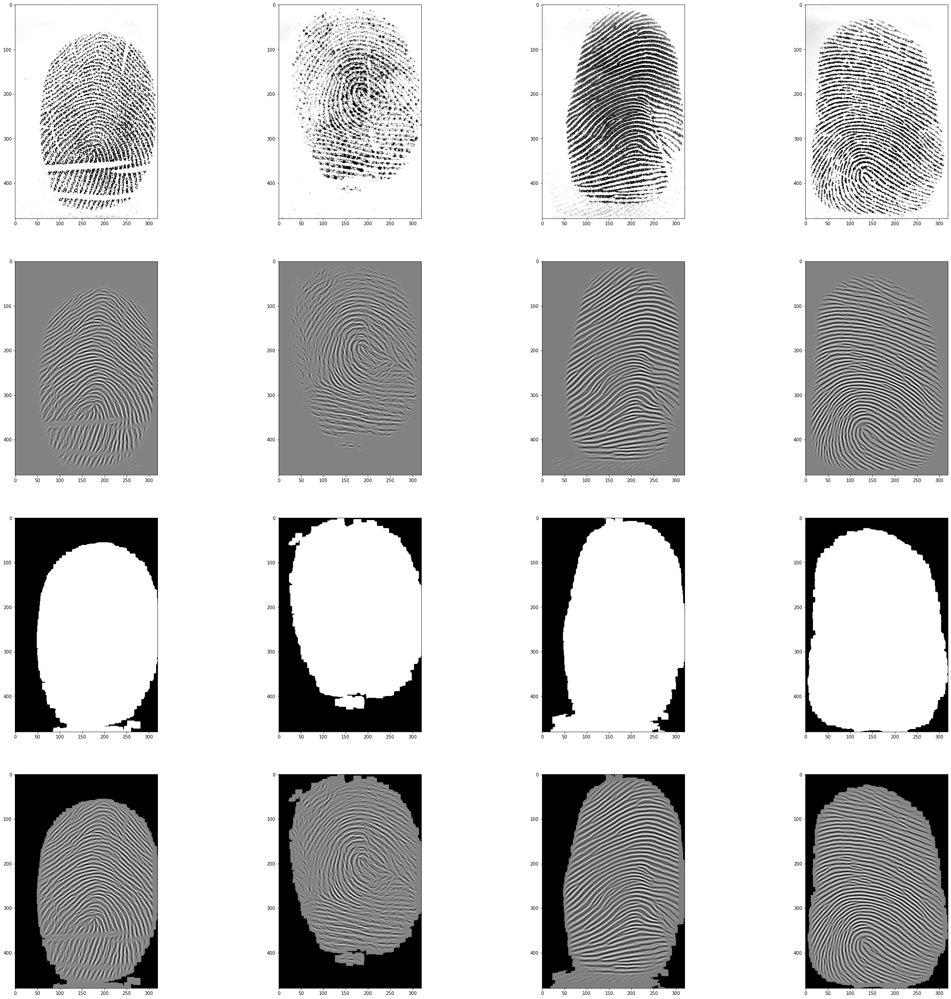

In [11]:
n=4
images_segmented_db = [a*b for a,b in zip(images_enhanced_db,masks_db)]
plot_image_sequence(images_db[:n] + images_enhanced_db.tolist()[:n] + masks_db.tolist()[:n] + images_segmented_db[:n], 4*n, n)

#### 3.2. Feature extraction
As you might have noticed by now comparing images on a pixel level is too simple and limited. The basic/traditional fingerprint matching algorithm are based on matching keypoints, called **minutiae**. They are defined as the ridge endings and bifurcations and can be determined by first thresholding the FP image and skeletonizing/thinning the enhanced image. For those really interested (but not part of this assignment) in experimenting with such an approach, some code is provided in the `fprmodules/minutiae_extraction` folder.

Instead, we will rely on establised methods developed in Computer Vision, where the use of keypoint features has proven to be very succesfull (prior to the advent of Deep Learning) in image classification, image alignment and object recognition tasks. A keypoint is a point of interest in an image, it does not necesarily need to be recognisable by a human but it can be. In this project we use keypoints to compare images on 3 levels:
1. Local feature descriptors
2. Global features
3. Hybrid features

To better highlight what is going on we will plot the results on two fingerprint images from our database.

In [12]:
# test example
testNr1 = 48

testNr2 = 17

**Keypoint detection** algorithms will result in points of interest on your image, which keypoints are used is dependent on the technique. We will make use of ORB (Oriented FAST and Rotated BRIEF) detection and descriptor algorithm as implemented in [OpenCV ORB](https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_feature2d/py_orb/py_orb.html).

A short overview of some methods can be found in the OpenCV documentation: [Feature detection and description](https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_feature2d/py_table_of_contents_feature2d/py_table_of_contents_feature2d.html). 

In [13]:
def detect_keypoints(img, mask, keypoint_detector, kernel_size=(5,5)):
    """
        Detects keypoints in an image. 
        
        Note: Many false keypoints will be generated at the edge of the foreground mask, since ridges seem to terminate due to the clipping.
        we remove these by a morpholigical erosion (shrinking) of the foreground mask and deleting the keypoints outside.
    """
    # find the keypoints with ORB

    kp = keypoint_detector.detect(img)
    #convert mask to an unsigned byte
    mask_b = mask.astype(np.uint8)  
    # morphological erosion
    mask_e = cv2.erode(mask_b*255, kernel = np.ones(kernel_size,np.uint8), iterations = 5)
    # remove keypoints and their descriptors that lie outside this eroded mask
    kpn = [kp[i] for i in range(len(kp)) if mask_e.item(int(kp[i].pt[1]),int(kp[i].pt[0])) == 255] 
    return kpn

detector = cv2.ORB_create()
# detector = cv2.SIFT_create() -- module 'cv2' has no attribute 'SIFT_create'
# detector = cv2.xfeatures2d.SURF_create(400) -- This algorithm is patented and is excluded in this configuration
kp1 = detect_keypoints(images_enhanced_db[testNr1], masks_db[testNr1], detector)
kp2 = detect_keypoints(images_enhanced_db[testNr2], masks_db[testNr2], detector)

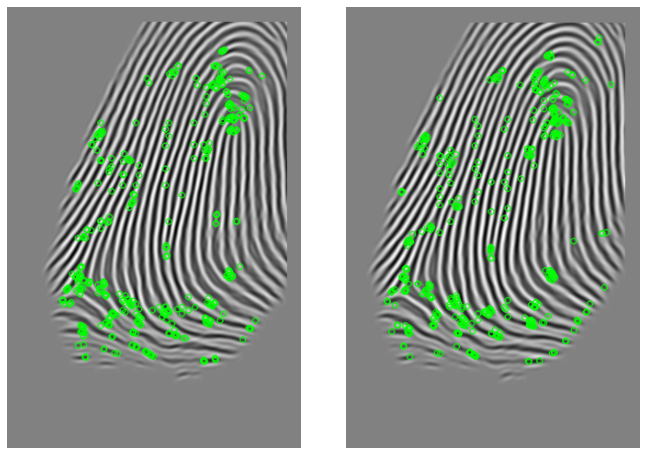

In [14]:
img1 = cv2.drawKeypoints(images_enhanced_db[testNr1],kp1,None,color=(0,255,0), flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)
img2 = cv2.drawKeypoints(images_enhanced_db[testNr2],kp2,None,color=(0,255,0), flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)

f, axarr = plt.subplots(1,2,sharey=True)
f.tight_layout()
#Uncomment below line to change figure size
f.set_size_inches(10,8)
axarr[0].axis('off')
axarr[1].axis('off')
axarr[0].imshow(img1),axarr[1].imshow(img2),plt.show();

**The Local Feature descriptor** gives a vector describing the local region around the key-point in the feature space. Note that these feature descriptors give a vectorial summary of the neighbourhood around each keypoint. A simple metric on these vectors (Euclidean Distance for continuous variables, Hamming Distance for binary variables) can then be used to determine similarity.

In [15]:
def compute_local_descriptor(img, kp, detector):
    kp, des = detector.compute(img, kp)
    return np.array(kp), des

kp1, local_des1 = compute_local_descriptor(images_enhanced_db[testNr1], kp1, detector)
kp2, local_des2 = compute_local_descriptor(images_enhanced_db[testNr2], kp2, detector)

#### 3.3. Local Keypoint Matching
**Keypoint Matchers** match keypoints that have similar descriptors in an image pair and computes the distances between the best matching pairs of keypoints. In this implementation we make use of the brute force matcher of OpenCV, documentation can be found [here](https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_feature2d/py_matcher/py_matcher.html). As a distance between descriptors we make use of the normalised [Hamming distance](https://en.wikipedia.org/wiki/Hamming_distance). 

In [16]:
def brute_force_matcher(des1, des2, dist=cv2.NORM_HAMMING):
    """
      Brute Force matcher on a pair of KeyPoint sets using the local descriptor for similarity
      returns all pairs of best matches
    """

    # crossCheck=True only retains pairs of keypoints that are each other best matching pair
    bf = cv2.BFMatcher(dist, crossCheck=True)
    matches = bf.match(des1, des2)
    
    # sort matches based on descriptor distance
    matches.sort(key=lambda x: x.distance, reverse=False)
    
    return np.array(matches)

# store the local keypoint matches
local_k1_k2_matches = brute_force_matcher(local_des1, local_des2, cv2.NORM_HAMMING)

# save the source index and target index of the keypoints in the corresponding keypoint sets
local_pt_source, local_pt_target = np.array([(match.queryIdx, match.trainIdx) for match in local_k1_k2_matches]).T

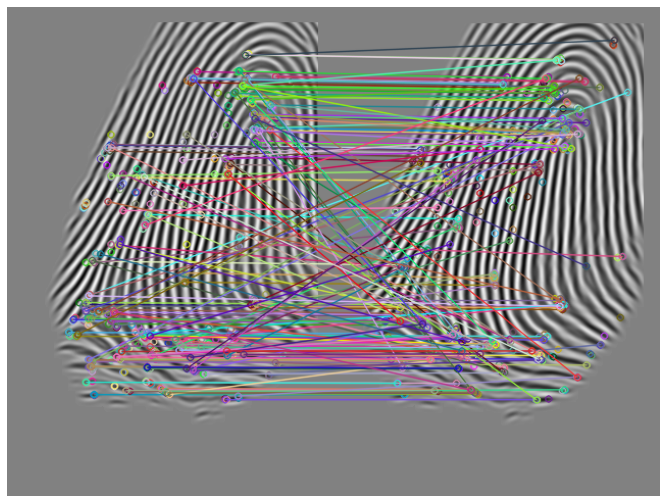

In [17]:
# Visualize the matched keypoints

imMatches = cv2.drawMatches(images_enhanced_db[testNr1],kp1,
                            images_enhanced_db[testNr2],kp2,local_k1_k2_matches, None) 
plt.imshow(imMatches)
plt.gcf().set_size_inches(18,9)
plt.gca().axis('off');

plt.show()

<div class="alert alert-block alert-success">
<b>Q2:</b> Are all the keypoint matches accurate? Are they expected to be? 
</div>

**Answer Q2:**  
Some keypoints are not accurate. For example, some are not located in any ridge endings or bifurcations. As a result, they are not matched with other keypoints.

<div class="alert alert-block alert-info">
<b>Tip:</b> Make sure you spent the proper amount of time on constructing the similarity metrics, a good implementation will save you a lot of time in the long run! </div>

#### 3.4. Local Similarity metric
Now that we have matching keypoints we can define simple scalar measures on this set of distances, such as the number of pairs with a distance smaller than a set threshold, or the sum/mean of the first N distances (ranked from small to larger), etc.

The local image similarity metric defined here is based on counting the number of distances between keypoint matches that are below an empirical distance threshold. The criterion when selecting a threshold is to separate the suspects scores as much as possible in order to have more confidence on the conclusion of who is the perpetrator. 

In [18]:
"""
We need to find how to extract the distances between the matched keypoints
What is this Matcher Object?
The result of matches = bf.match(des1,des2) line is a list of DMatch objects. 
This DMatch object has following attributes:
    DMatch.distance - Distance between descriptors. The lower, the better it is.
    DMatch.trainIdx - Index of the descriptor in train descriptors
    DMatch.queryIdx - Index of the descriptor in query descriptors
    DMatch.imgIdx - Index of the train image.
"""

def local_img_similarity(matches):
    # returns the number of distances between matches that are below a threshold
    num_of_dist_above_thresh = 0
    # higher threshold --> less strict similarity measure
    # lower threshold --> stricter similarity measure
    thresh = 60
    for i in range(0,len(matches)):
        if matches[i].distance < thresh:
            num_of_dist_above_thresh +=1
    return num_of_dist_above_thresh
  
#--- Test Function call ---
local_img_similarity(matches=local_k1_k2_matches)

107

In [19]:
def local_similarity(masked_fp1, masked_fp2, detector=cv2.ORB_create(), kp_erosion_ksize = (5,5)):
    # separate the semgentation from the image
    fp1, mask1 = masked_fp1[...,0], masked_fp1[...,1] 
    fp2, mask2 = masked_fp2[...,0], masked_fp2[...,1] 
    
    # detect the keypoints
    kp1 = detect_keypoints(fp1, mask1, detector, kernel_size = kp_erosion_ksize)
    kp2 = detect_keypoints(fp2, mask2, detector, kernel_size = kp_erosion_ksize)
    
    # compute descriptor for each keypoints
    kp1, local_des1 = compute_local_descriptor(fp1, kp1, detector)
    kp2, local_des2 = compute_local_descriptor(fp2, kp2, detector)
    
    # find matches between keypoints based on local feature descriptor
    local_k1_k2_matches = brute_force_matcher(local_des1, local_des2, cv2.NORM_HAMMING)
    
    # distances between matches that are below threshold
    return local_img_similarity(local_k1_k2_matches)

<div class="alert alert-block alert-info">
<b>Tip:</b> Don't forget to apply the same preprocessing to the perpetrator image.

</div>


In [20]:
perp_img_en, perp_img_mask = enhance_images([perpetrator_fp])
perp_img_en = perp_img_en[0]
perp_img_mask = perp_img_mask[0]

  0%|          | 0/1 [00:00<?, ?it/s]

#### 3.5 Local Similarity Scores

In [21]:
sim_tb1 = constructSimilarityTable(np.stack((perp_img_en,perp_img_mask),-1), np.stack((images_segmented_db,masks_db),-1), labels_db, local_similarity)

,id,score
55,056,68
48,049,57
75,076,56
21,022,50
17,018,47
...,...,...
72,073,2
35,036,2
76,077,1
84,085,1


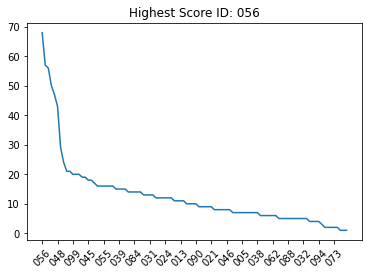

In [22]:
sim_tb1 = sim_tb1.sort_values(by='score', ascending=False)
ids,scores = sim_tb1.values[:,0],sim_tb1.values[:,1]
plt.plot(ids,scores)
plt.xticks(np.arange(0,100,5),ids[np.arange(0,100,5)],rotation = 45)
plt.title('Highest Score ID: '+ ids[0]);

#Display the dataframe containing the local similarity scores 
sim_tb1

A good idea in this plot, where we cannot see one clear subject (as the first 6 subjects are all pretty close), is to take a look at the knee point for a score threshold. Also, let's normalize our scores in order to get a well generalized scale.

Knee at: 8	 Treshold:  0.29850746268656714


 With the threshold of 0.299, we can see a more clear divide between the subjects. However, the best 8 matches are all pretty close... We should be able to come up with a better discriminator by using a global similarity metric.

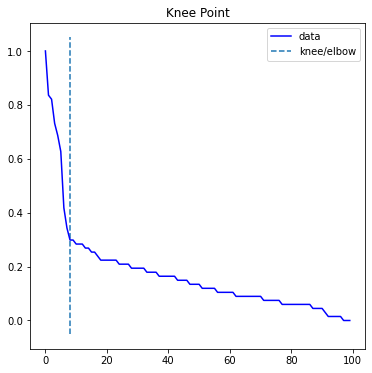

In [23]:
#Simple module to find the knee in a series
from kneed import KneeLocator

scores_local = (scores - scores.min()) / (scores.max() - scores.min())

kneedle = KneeLocator(list(range(len(ids))),scores_local,S=1, curve='convex', direction='decreasing')
print(f'Knee at: {kneedle.knee}\t Treshold: ',kneedle.knee_y)
kneedle.plot_knee()
Markdown(f" With the threshold of {kneedle.knee_y:.3f}, we can see a more clear divide between the subjects. However, the best 8 matches are all pretty close... We should be able to come up with a better discriminator by using a global similarity metric." )

### 4. Model extension 2: Global similarity


**Global features**, here we use the matching keypoints to align the fingerprints, this allows us to compare the images as a whole (globally). Once the images are aligned we can take into account the distance between the key-points in the ambient space (the coordinates of the key-points). This is also referred to as geometrical distance since this is just comparing two points that are part of the intrinsic geometry of the object (no matter how you move the image around the point will move around with it and stay in the same location on the finger).

#### 4.1 Image alignment
[Here](https://www.learnopencv.com/image-alignment-feature-based-using-opencv-c-python/) you can find a description and code how to start from the brute force matching results and estimate the best transformation (from a family of transformations) that aligns the two images. In the example, a homography-type transformation is searched for. However, this has too many degrees of freedom for our application. We substituted this by a more constrained (only 4 degrees of freedom) similarity (partial affine) transformation.

These routines iteratively determine the minimal set of matching points that define a transformation that optimally aligns all other points as well, taking care of outliers at the same time. This method is a very general optimization technique and is called RANSAC, for "RANdom SAmple Consensus". See, apart from many other sources on the internet, [this presentation](http://www.cse.psu.edu/~rtc12/CSE486/lecture15.pdf) for further explanation. 

In [24]:
def estimate_affine_transform_by_kps(src_pts, dst_pts):
    """
        Returns the Affine transformation that aligns two sets of points
        
        cv2.estimateAffinePartial2D:
        http://amroamroamro.github.io/mexopencv/matlab/cv.estimateAffinePartial2D.html
    """
    transform_matrix, inliers = cv2.estimateAffinePartial2D(src_pts, dst_pts, 
                                           method =  cv2.RANSAC, 
                                           confidence = 0.9, 
                                           ransacReprojThreshold = 10.0, 
                                           maxIters = 5000, 
                                           refineIters = 10)
    return transform_matrix, inliers[:,0]

def warp_points(pts, M):
    mat_reg_points = cv2.transform(pts.reshape(-1,1,2), M)
    # return transformed keypoint list
    return cv2.KeyPoint.convert(mat_reg_points) 

def warp_img(img, M):
    return cv2.warpAffine(img, M, (img.shape[1], img.shape[0]))

# estimate the affine transform that aligns the matched keypoints
# M : transform_matrix
M, inliers = estimate_affine_transform_by_kps(
    cv2.KeyPoint.convert(np.array(kp1)[local_pt_source]), 
    cv2.KeyPoint.convert(np.array(kp2)[local_pt_target]))

# cv2.KeyPoint.convert : This method converts vector of keypoints to vector of points or the reverse, 
# where each keypoint is assigned the same size and the same orientation.
kp1_reg = warp_points(cv2.KeyPoint.convert(kp1), M)
img1_reg =  warp_img(images_enhanced_db[testNr1], M)

#plt.imshow(img1_reg)
#plt.show()

# <KeyPoint ___ >
# Parameters
#     pt	    x & y coordinates of the keypoint
#     size	    keypoint diameter
#     angle	    keypoint orientation
#     response	keypoint detector response on the keypoint (that is, strength of the keypoint)
#     octave	pyramid octave in which the keypoint has been detected
#     class_id	object id 

Let's have a look at how the images are alinged. Let's visualize different pairs of fingerprints! You may notice the estimated transform will be more extreme for images that are less similar, and will become more subtle as the images become more similar.

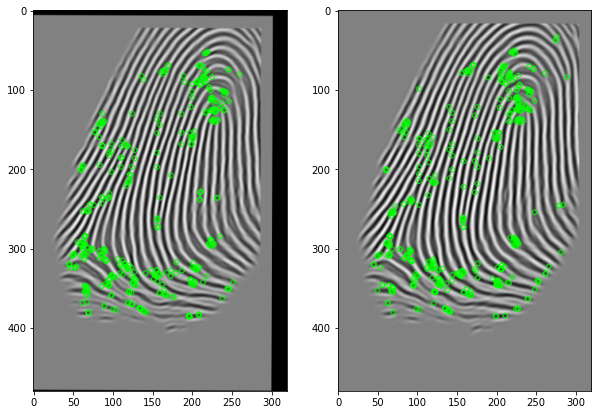

In [25]:
show_img1 = cv2.drawKeypoints(img1_reg, kp1_reg, None, (0, 255, 0), cv2.DRAW_MATCHES_FLAGS_DEFAULT)
show_img2 = cv2.drawKeypoints(images_enhanced_db[testNr2], kp2, None, (0, 255, 0), cv2.DRAW_MATCHES_FLAGS_DEFAULT)

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize=(10,10))
_=ax[0].imshow(show_img1), ax[1].imshow(show_img2), plt.show()

Apparently, the `estimateAffinePartial2D` function does not only return the transformation matrix but also the minimal set of matching points that were used to to determine the transformation. This gives us a better, more refined set of keypoints. 

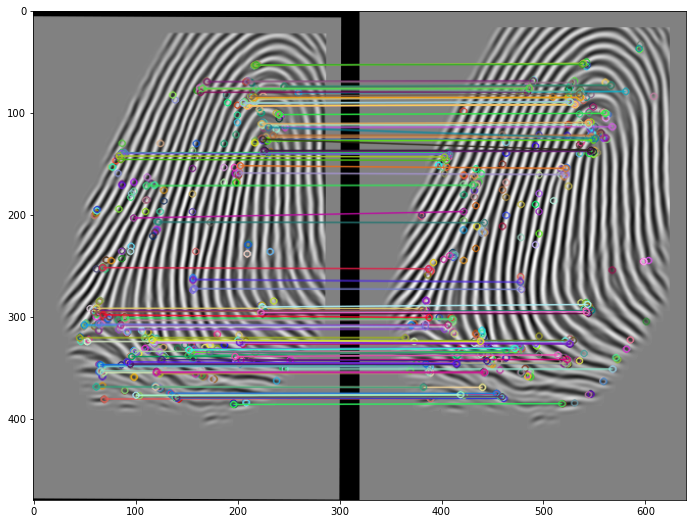

In [26]:
global_k1_k2_matches = local_k1_k2_matches[inliers == 1]

imMatches = cv2.drawMatches(img1_reg, kp1_reg, images_enhanced_db[testNr2], kp2, global_k1_k2_matches.tolist(), None)
_ = plt.imshow(imMatches)
f=plt.gcf()
f.set_size_inches(18,9), plt.show();


# drawMatches() 
# This function draws matches of keypoints from two images in the output image. 
# Match is a line connecting two keypoints (circles). 

# Parameters
#     img1	        First source image.
#     keypoints1	Keypoints from the first source image.
#     img2	        Second source image.
#     keypoints2	Keypoints from the second source image.
#     matches1to2	Matches from the first image to the second one, which means that keypoints1[i] has a corresponding point in keypoints2[matches[i]] .
#     outImg	    Output image. Its content depends on the flags value defining what is drawn in the output image. See possible flags bit values below.
#     matchColor	Color of matches (lines and connected keypoints). If matchColor==Scalar::all(-1) , the color is generated randomly.
#     singlePointColor	Color of single keypoints (circles), which means that keypoints do not have the matches. If singlePointColor==Scalar::all(-1) , the color is generated randomly.
#     matchesMask	    Mask determining which matches are drawn. If the mask is empty, all matches are drawn.
#     flags	            Flags setting drawing features. Possible flags bit values are defined by DrawMatchesFlags.

#### 4.2 Global Similarity Metric

<div class="alert alert-block alert-success">
<b>Q3: </b> Choose a global feature similarity function, (e.g. euclidean distance between the reduced sets of KeyPoints and count the values above a threshold).
</div>

In [27]:
def get_reduced_set(matches,reg_kp1,kp2):
    # get reduced keypoint set from matches
    reg_kp1 = cv2.KeyPoint_convert(reg_kp1)
    kp2 = cv2.KeyPoint_convert(kp2)
    kp1_reduced,kp2_reduced = [],[]
    for i in matches:
        kp1_reduced.append(reg_kp1[i.queryIdx])
        kp2_reduced.append(kp2[i.trainIdx])
    return kp1_reduced,kp2_reduced

###############################################
# --- TEST THE get_reduced_set FUNCTION ---
kp1_reduced,kp2_reduced = get_reduced_set(global_k1_k2_matches,kp1_reg,kp2)  
#the args selection here is the same as in the return part of the global_similarity function 

In [28]:
def global_img_similarity(matches, reg_kp1, kp2):
    # returns a similarity score between the reduced keypoints of 2 images
    # the similarity score is the number of keypoint pairs that are below a Euclidean distance threshold 
    
    # Get the (x,y) coordinates sets of the reduced keypoints 
    kp1_reduced,kp2_reduced = get_reduced_set(matches,reg_kp1,kp2)
    
    distances = np.zeros(len(kp1_reduced))
    
    # Define Euclidean distance threshold. 
    # high threshold --> less strict similarity measure
    # low threshold --> stricter similarity measure
    thresh = 1
    
    # Extract the (x,y) coordinates of each keypoint:
    # x-coordinates of the image1 keypoints 
    x1 = np.zeros(len(kp1_reduced))
    # y-coordinates of the image1 keypoints 
    y1 = np.zeros(len(kp1_reduced))
    # x-coordinates of the image2 keypoints  
    x2 = np.zeros(len(kp1_reduced))
    # y-coordinates of the image2 keypoints 
    y2 = np.zeros(len(kp1_reduced))
    
    for i in range(0,len(kp1_reduced)):
        x1[i] = kp1_reduced[i][0] 
        y1[i] = kp1_reduced[i][1]
        x2[i] = kp2_reduced[i][0] 
        y2[i] = kp2_reduced[i][1]
    
    count = 0
    for i in range(0,len(kp1_reduced)):        
        # Calculate the euclidean distance between each keypoint pair
        distances[i] = np.linalg.norm(np.array([x1[i],y1[i]])-np.array([x2[i],y2[i]]))
        
        # We count how many keypoint pairs are below the distance threshold
        # The greater the count, the higher the similarity between the threshold
        if distances[i] < thresh:
            count +=1
     
    return count

#########
# TEST THE global_img_similarity FUNCTION
count = global_img_similarity(global_k1_k2_matches,kp1_reg,kp2)
count

61

In [29]:
def global_similarity(masked_fp1, masked_fp2, detector=cv2.ORB_create(), kp_erosion_ksize = (5,5)):
    # separate the segmentation from the image
    fp1, mask1 = masked_fp1[...,0], masked_fp1[...,1] 
    fp2, mask2 = masked_fp2[...,0], masked_fp2[...,1] 
    
    # detect the keypoints
    kp1 = detect_keypoints(fp1, mask1, detector, kernel_size = kp_erosion_ksize)
    kp2 = detect_keypoints(fp2, mask2, detector, kernel_size = kp_erosion_ksize)
    
    # compute descriptor vector
    kp1, local_des1 = compute_local_descriptor(fp1, kp1, detector)
    kp2, local_des2 = compute_local_descriptor(fp2, kp2, detector)
    
    # find matches between keypoints based on local feature descriptor
    local_k1_k2_matches = brute_force_matcher(local_des1, local_des2, cv2.NORM_HAMMING)
    
    # get source and target index for each match
    local_pt_source, local_pt_target = np.array([
        (match.queryIdx, match.trainIdx) for match in local_k1_k2_matches]).T
    
    # use matching keypoints to estimate an affine transform between keypoints
    # M: affine transformation matrix
    M, inliers = estimate_affine_transform_by_kps(
        cv2.KeyPoint.convert(kp1[local_pt_source]), 
        cv2.KeyPoint.convert(kp2[local_pt_target]))
    
    # if no inliers can be found
    if M is None: 
        return 0
    
    # warp the keypoints according to the found transform
    kp1_reg = warp_points(cv2.KeyPoint.convert(kp1), M)
    
    # subset the keypoints, inliers are considered good keypoints
    # since they were used in finding the transformation
    global_k1_k2_matches = local_k1_k2_matches[inliers == 1]
    
    # compute global similarity based aligned matching global keypoints
    return global_img_similarity(global_k1_k2_matches,kp1_reg, kp2)
 
sim_tb2 = constructSimilarityTable(np.stack((perp_img_en,perp_img_mask),-1), np.stack((images_segmented_db,masks_db),-1), labels_db, global_similarity)

<div class="alert alert-block alert-success">
<b>Q4: </b> Visualize the scores and determine a score threshold to discriminate the matching fingerprints. Explain how you determine the threshold.
</div>

Knee at: 6	 Treshold:  0.04081632653061224


,id,score
55,056,49
17,018,30
75,076,30
48,049,28
47,048,25
...,...,...
62,063,0
63,064,0
64,065,0
16,017,0


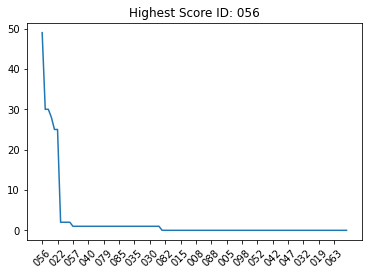

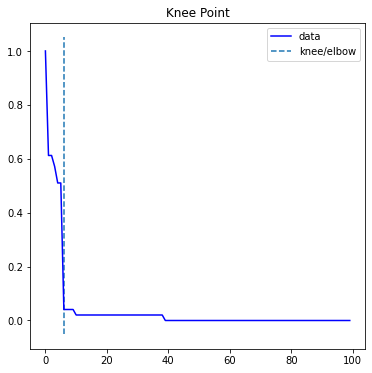

In [30]:
"""
For each image, plot its global similarity score with the perpetrator image.
Somehow the threshold needs to be parametrized in order to pick the best parameter in the end.
"""

sim_tb2 = sim_tb2.sort_values(by='score', ascending=False)
ids_2,scores_2 = sim_tb2.values[:,0],sim_tb2.values[:,1]
plt.plot(ids_2,scores_2)
plt.xticks(np.arange(0,100,5),ids_2[np.arange(0,100,5)],rotation = 45)
plt.title('Highest Score ID: '+ids_2[0]);

scores_global = (scores_2 - scores_2.min()) / (scores_2.max() - scores_2.min())

kneedle2 = KneeLocator(list(range(len(ids_2))),scores_global,S=1, curve='convex', direction='decreasing')
print(f'Knee at: {kneedle2.knee}\t Treshold: ',kneedle2.knee_y)
kneedle2.plot_knee()

Markdown(f" With the threshold of {kneedle2.knee_y:.3f}, we can see a more clear divide between the subjects but still, we cannot come to high-certainty conclusions. " )

# Display the dataframe containing the global similarity score 
# of each image in the database with the perpetrator image
sim_tb2

### 5. Model extension 3: Hybrid features


Since we again run into the same problem of a lack of clear disctinction, we can now give hybrid features a shot.

#### 5.1 Hybrid Similarity metric
<div class="alert alert-block alert-success">
<b>Q5: </b> Choose a hybrid feature similarity function that makes use of both the geometric distance and the feature distance of the keypoints. Using this hybrid function, visualize and assess the matches.
</div>

In [31]:
def hybrid_img_similarity(local_matches,global_matches, kp1_reg, kp2):    
    local_similarity_weight = 0.4
    global_similarity_weight = 0.6
    
    local_similarity_score = local_img_similarity(local_matches)
    global_similarity_score = global_img_similarity(global_matches,kp1_reg,kp2)
    weighted_sum = local_similarity_weight*local_similarity_score + global_similarity_weight*global_similarity_score
    return weighted_sum

#### 5.2 Construct hybrid similarity matrix


In [32]:
def hybrid_similarity(masked_fp1, masked_fp2, detector=cv2.ORB_create(), kp_erosion_ksize = (5,5)):
    # separate the semgentation from the image
    fp1, mask1 = masked_fp1[...,0], masked_fp1[...,1] 
    fp2, mask2 = masked_fp2[...,0], masked_fp2[...,1] 
    
    # detect the keypoints
    kp1 = detect_keypoints(fp1, mask1, detector, kernel_size=kp_erosion_ksize)
    kp2 = detect_keypoints(fp2, mask2, detector, kernel_size= kp_erosion_ksize)
    
    # compute descriptor for each keypoints
    kp1, local_des1 = compute_local_descriptor(fp1, kp1, detector)
    kp2, local_des2 = compute_local_descriptor(fp2, kp2, detector)
    
    # find matches between keypoints based on local feature descriptor
    local_k1_k2_matches = brute_force_matcher(local_des1, local_des2, cv2.NORM_HAMMING)
    
    # get source and target index for each match
    local_pt_source, local_pt_target = np.array([
        (match.queryIdx, match.trainIdx) for match in local_k1_k2_matches]).T
    
    # use matching keypoints to estimate an affine transform between keypoints
    M, inliers = estimate_affine_transform_by_kps(
        cv2.KeyPoint.convert(kp1[local_pt_source]), 
        cv2.KeyPoint.convert(kp2[local_pt_target]))
    
    # if no inliers can be found
    if M is None: 
        return 0
    
    # warp the keypoints according to the found transform
    kp1_reg = warp_points(cv2.KeyPoint.convert(kp1), M)
    
    # subset the keypoints, inliers are considered good keypoints
    # since they were used in finding the transformation
    global_k1_k2_matches = local_k1_k2_matches[inliers == 1]

    # compute hybrid similarity based on aligned matching keypoints
    # Based on weighted sum of local and global similarity
    return hybrid_img_similarity(local_k1_k2_matches,global_k1_k2_matches, kp1_reg, kp2)
    
sim_tb3 = constructSimilarityTable(np.stack((perp_img_en,perp_img_mask),-1), np.stack((images_segmented_db,masks_db),-1), labels_db, hybrid_similarity)

Knee at: 8	 Treshold:  0.13978494623655913


,id,score
55,056,56.6
75,076,40.4
48,049,39.6
17,018,36.8
21,022,35.0
...,...,...
84,085,1.0
80,081,1.0
35,036,0.8
41,042,0.8


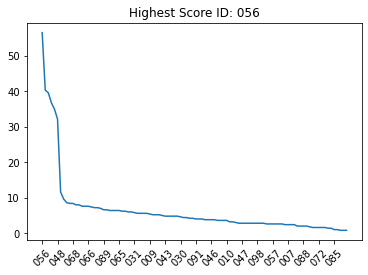

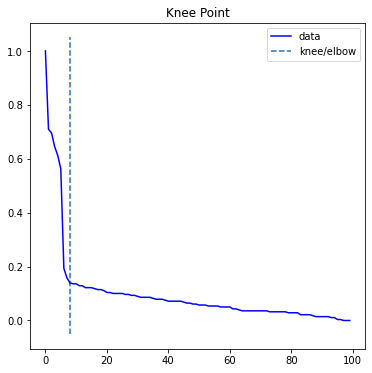

In [33]:
"""
For each image, plot its global similarity score with the perpetrator image.
Somehow the threshold needs to be parametrized in order to pick the best parameter in the end.
"""

sim_tb3 = sim_tb3.sort_values(by='score', ascending=False)
ids_3,scores_3 = sim_tb3.values[:,0],sim_tb3.values[:,1]
plt.plot(ids_3,scores_3)
plt.xticks(np.arange(0,100,5),ids_3[np.arange(0,100,5)],rotation = 45)
plt.title('Highest Score ID: '+ids_3[0]);

scores_hybrid = (scores_3 - scores_3.min()) / (scores_3.max() - scores_3.min())

kneedle3 = KneeLocator(list(range(len(ids_3))),scores_hybrid,S=1, curve='convex', direction='decreasing')
print(f'Knee at: {kneedle3.knee}\t Treshold: ',kneedle3.knee_y)
kneedle3.plot_knee()

# Display the dataframe containing the global similarity score 
# of each image in the database with the perpetrator image

Markdown(f" With the threshold of {kneedle2.knee_y:.3f}, we can see a more clear divide between the subjects but still, we cannot come to high-certainty conclusions. " )

sim_tb3

Oh no! Still no clear distinction... This is suspicious, let's take a look at the best matching fingerprints.

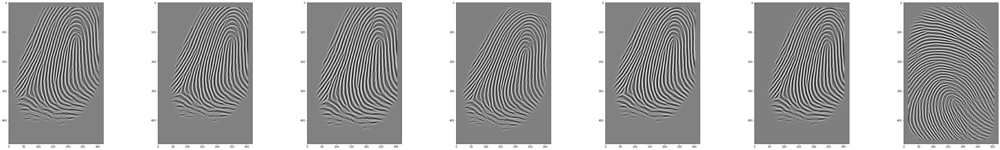

In [34]:
def get_image_by_label(ind):
    for i in range(len(labels_db)):
        if labels_db[i] == ind:
            return images_enhanced_db[i]
    raise ValueError("No image with this label is found.")

imgs = [get_image_by_label(i) for i in ids[:kneedle.knee]]

plot_image_sequence(imgs,kneedle.knee if kneedle.knee<=7 else 7)

The top matching subjects all have the same fingerprint! The murderer must have hacked the database and replicated some of the images, effectively covering their tracks. They seem to be one step ahead all the time... Or so they think! Fingerprints are not the only biometric we can evaluate.

### **TASK H/Task 8**: [FING] Attempt to improve the feature extraction using a completely different technique. 

### Workflow of the Minutiae Feature Extractor
The two different types of minutiae extracted here are the bifurcations of and terminations of the fingerprint lines.  
Important Note: Only the terminations in the interior of the fingerprint image are found. The ridge line endings in the boundaries of the fingerpint do not correspond to actual endings as they are just the limits of the fingerprint capture.

* **Skeletonization**  
Reduces binary objects to 1 pixel wide representations.   
This can be useful for feature extraction, and/or representing an object’s topology.  
Skeletonize works by making successive passes of the image.   
On each pass, border pixels are identified and removed on the condition that they do not break the connectivity of the corresponding object.  

* **Angle computation**
Part of each minutia description is the calculation of its orientation which correspond to an angle between the minutia vector and the x-axis(+) 

* **Terminations and Bifurcations locations detection**
For each minutia, its center has to be found in order to define its location on the enhanced fingerprint image.

* **Spurious Minutiae removal**
    * Spurious minutiae include:
        * Endings that lie on the margins of the region of interest
        * two "close" endings with the same ridge orientation
        * an ending and a bifurcation that are connected and close enough
        * two bifurcations that are too close

In [35]:
# Alternative way for feature extraction (minutiae extraction)
# based on https://github.com/Utkarsh-Deshmukh/Fingerprint-Feature-Extraction

import cv2
import numpy as np
import skimage.morphology
from skimage.morphology import convex_hull_image, erosion
from skimage.morphology import square
import math

class MinutiaeFeature(object):
    # Constructor of a minutia object
    def __init__(self, locX, locY, Orientation, Type):
        self.locX = locX                # Minutia center location (x-y pixels)
        self.locY = locY
        self.Orientation = Orientation  # Minutia angle with x-axis
        self.Type = Type                # Type: bifurcation or termination

class FingerprintFeatureExtractor(object):
    # Constructor of a Feature Extractor object
    def __init__(self):
        self._mask = []
        self._skel = []         # 1 pixel wide representation image of the fingerprint ridge lines
        self.minutiaeTerm = []  # list containing the locations of the termination-type minutiae objects
        self.minutiaeBif = []   # list containing the locations of the bifurcation-type minutiae objects
    
    def __skeletonize(self, img):
        # creates the ridges topology of the fingerprint while eliminating discontinuities and stores them in _skel
        img = np.uint8(img > 128)
        self._skel = skimage.morphology.skeletonize(img)
        self._skel = np.uint8(self._skel) * 255
        self._mask = img * 255

    # Depending on the type of the minutiae, their angles are calculated
    def __computeAngle(self, block, minutiaeType):
        angle = []
        (blkRows, blkCols) = np.shape(block)
        CenterX, CenterY = (blkRows - 1) / 2, (blkCols - 1) / 2
        if (minutiaeType.lower() == 'termination'):
            sumVal = 0
            for i in range(blkRows):
                for j in range(blkCols):
                    if ((i == 0 or i == blkRows - 1 or j == 0 or j == blkCols - 1) and block[i][j] != 0):
                        angle.append(-math.degrees(math.atan2(i - CenterY, j - CenterX)))
                        sumVal += 1
                        if (sumVal > 1):
                            angle.append(float('nan'))
            return (angle)

        elif (minutiaeType.lower() == 'bifurcation'):
            (blkRows, blkCols) = np.shape(block)
            CenterX, CenterY = (blkRows - 1) / 2, (blkCols - 1) / 2
            angle = []
            sumVal = 0
            for i in range(blkRows):
                for j in range(blkCols):
                    if ((i == 0 or i == blkRows - 1 or j == 0 or j == blkCols - 1) and block[i][j] != 0):
                        angle.append(-math.degrees(math.atan2(i - CenterY, j - CenterX)))
                        sumVal += 1
            if (sumVal != 3):
                angle.append(float('nan'))
            return (angle)

    def __getTerminationBifurcation(self):
        # Finds the minutiae locations and stores theim in the minutiaeTerm and minutiaeBif arrays
        self._skel = self._skel == 255
        (rows, cols) = self._skel.shape
        self.minutiaeTerm = np.zeros(self._skel.shape)
        self.minutiaeBif = np.zeros(self._skel.shape)

        for i in range(1, rows - 1):
            for j in range(1, cols - 1):
                if (self._skel[i][j] == 1):
                    block = self._skel[i - 1:i + 2, j - 1:j + 2]
                    block_val = np.sum(block)
                    if (block_val == 2):
                        self.minutiaeTerm[i, j] = 1
                    elif (block_val == 4):
                        self.minutiaeBif[i, j] = 1

        self._mask = convex_hull_image(self._mask > 0)
        self._mask = erosion(self._mask, square(5))  # Structuring element for mask erosion = square(5)
        self.minutiaeTerm = np.uint8(self._mask) * self.minutiaeTerm
 
    def __removeSpuriousMinutiae(self, minutiaeList, img, thresh):        
        img = img * 0
        SpuriousMin = []
        numPoints = len(minutiaeList)
        D = np.zeros((numPoints, numPoints))
        for i in range(1,numPoints):
            for j in range(0, i):
                (X1,Y1) = minutiaeList[i]['centroid']
                (X2,Y2) = minutiaeList[j]['centroid']

                dist = np.sqrt((X2-X1)**2 + (Y2-Y1)**2)
                D[i][j] = dist
                if(dist < thresh):
                    SpuriousMin.append(i)
                    SpuriousMin.append(j)

        SpuriousMin = np.unique(SpuriousMin)
        for i in range(0,numPoints):
            if(not i in SpuriousMin):
                (X,Y) = np.int16(minutiaeList[i]['centroid'])
                img[X,Y] = 1

        img = np.uint8(img)
        return(img)

    def __cleanMinutiae(self, img):
        # Clean spurious termination minutiae 
        self.minutiaeTerm = skimage.measure.label(self.minutiaeTerm, connectivity=2)
        RP = skimage.measure.regionprops(self.minutiaeTerm)
        self.minutiaeTerm = self.__removeSpuriousMinutiae(RP, np.uint8(img), 10)

        # Clean spurious bifurcation minutiae
        self.minutiaeBif = skimage.measure.label(self.minutiaeBif, connectivity=2)
        RP2 = skimage.measure.regionprops(self.minutiaeBif)
        self.minutiaeBif = self.__removeSpuriousMinutiae(RP2, np.uint8(img), 5)

    def __performFeatureExtraction(self):
        # Returns a 2-tuple of two lists, one containing the termination minutiae and one containing the bifurcation minutiae
        FeaturesTerm = []
        self.minutiaeTerm = skimage.measure.label(self.minutiaeTerm, connectivity=2)
        RP = skimage.measure.regionprops(np.uint8(self.minutiaeTerm))

        WindowSize = 2  # --> For Termination, the block size must can be 3x3, or 5x5. Hence the window selected is 1 or 2
        FeaturesTerm = []
        for num, i in enumerate(RP):
            (row, col) = np.int16(np.round(i['Centroid']))
            block = self._skel[row - WindowSize:row + WindowSize + 1, col - WindowSize:col + WindowSize + 1]
            angle = self.__computeAngle(block, 'Termination')
            if(len(angle) == 1):
                FeaturesTerm.append(MinutiaeFeature(row, col, angle, 'Termination'))

        FeaturesBif = []
        self.minutiaeBif = skimage.measure.label(self.minutiaeBif, connectivity=2)
        RP = skimage.measure.regionprops(np.uint8(self.minutiaeBif))
        WindowSize = 1  # --> For Bifurcation, the block size must be 3x3. Hence the window selected is 1
        for i in RP:
            (row, col) = np.int16(np.round(i['Centroid']))
            block = self._skel[row - WindowSize:row + WindowSize + 1, col - WindowSize:col + WindowSize + 1]
            angle = self.__computeAngle(block, 'Bifurcation')
            if(len(angle) == 3):
                FeaturesBif.append(MinutiaeFeature(row, col, angle, 'Bifurcation'))
        return (FeaturesTerm, FeaturesBif)

    def extractMinutiaeFeatures(self, img):
        self.__skeletonize(img)

        self.__getTerminationBifurcation()

        self.__cleanMinutiae(img)

        FeaturesTerm, FeaturesBif = self.__performFeatureExtraction()
        return(FeaturesTerm, FeaturesBif)

    def draw_minutiae(self, FeaturesTerm, FeaturesBif):
        # The image to be displayed contains the skeletonized ridge lines
        # it contains 3 channels so we can represent minutiae locations in color
        (rows, cols) = self._skel.shape
        DispImg = np.zeros((rows, cols, 3), np.uint8)
        DispImg[:, :, 0] = 255*self._skel
        DispImg[:, :, 1] = 255*self._skel
        DispImg[:, :, 2] = 255*self._skel

        # Draw Termination Minutiae on the image to be displayed
        for idx, curr_minutiae in enumerate(FeaturesTerm):
            row, col = curr_minutiae.locX, curr_minutiae.locY
            (rr, cc) = skimage.draw.circle_perimeter(row, col, 3)
            skimage.draw.set_color(DispImg, (rr, cc), (255, 255, 0))

        # Draw Bifurcation Minutiae on the image to be displayed
        for idx, curr_minutiae in enumerate(FeaturesBif):
            row, col = curr_minutiae.locX, curr_minutiae.locY
            (rr, cc) = skimage.draw.circle_perimeter(row, col, 3)
            skimage.draw.set_color(DispImg, (rr, cc), (255, 0, 0))
        
        #plt.figure(figsize=(100, 80), dpi=80)
        #plt.imshow(DispImg)
        #plt.show()
        #cv2.imshow('output', DispImg)
        #cv2.waitKey(0)
        return DispImg

def extract_minutiae_features(img):
    feature_extractor = FingerprintFeatureExtractor()
    FeaturesTerm, FeaturesBif = feature_extractor.extractMinutiaeFeatures(img)

    DispImg = feature_extractor.draw_minutiae(FeaturesTerm, FeaturesBif)

    return(FeaturesTerm, FeaturesBif,DispImg)

1 / 8  processed
2 / 8  processed
3 / 8  processed
4 / 8  processed
5 / 8  processed
6 / 8  processed
7 / 8  processed
8 / 8  processed
RED circles: Bifurcations
YELLOW circles: Terminations


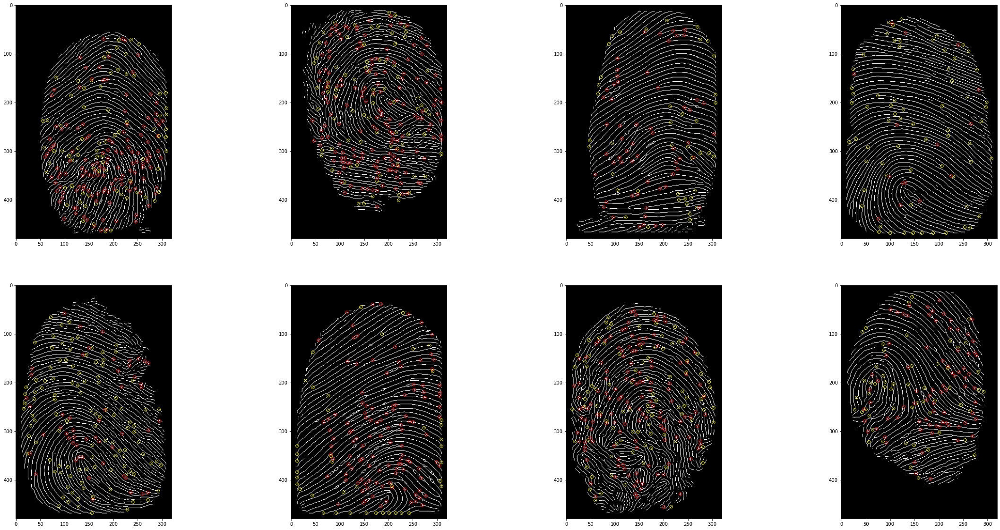

In [36]:
def threshold_img(image):
    thresholded_img = cv2.adaptiveThreshold(image,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,11,2)
    inverted = np.invert(thresholded_img)
    # plt.figure(figsize=(10, 8), dpi=80)
    # plt.imshow(inverted)
    # plt.show()
    return inverted

num_of_images = 8
indx1 = 0

DispImages = []
for i in range(indx1,indx1+num_of_images):
    (FeaturesTerminations, FeaturesBifurcations, DispImg) = extract_minutiae_features(threshold_img(images_enhanced_db[i]))
    DispImages.append(DispImg)
    print(len(DispImages),"/",num_of_images," processed")

print("RED circles: Bifurcations")
print("YELLOW circles: Terminations")
plot_image_sequence(DispImages, num_of_images, imgs_per_row=4, figsize=(10,10), cmap='gray')

## III. Iris recognition
Now let's create a biometric system for the iris data. 

In [37]:
# set path
# CHANGE THIS FOR YOUR SYSTEM
iris_data_path = 'data/CASIA1'

### 1. Reading data

<div class="alert alert-block alert-success">
<b>Q6: </b> Check out <code>iris_perpetrator.png</code>. Where do you see difficulties? What kind of similarity measures do you expect to work best?
</div>

The iris image does not only contain the region of interest from which we will extract the actual biometric characteristic which is only the pattern of the ring around the pupil. It also contains parts of the eyelids and skin around the eye. We need to implement our algorithm in such a way that eliminates the contribution of these regions to the final features extracted.

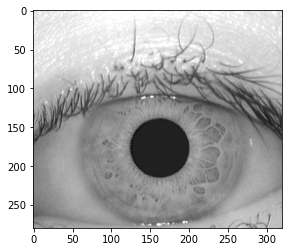

In [38]:
iris_perpetrator = cv2.cvtColor(cv2.imread("perpetrator_iris.bmp"),cv2.COLOR_BGR2GRAY)
plt.imshow(iris_perpetrator,cmap='gray');

Let's read the iris data.

In [39]:
def read_iris_DB(path):
    images = []
    labels = []
    imagePaths = sorted(os.listdir('data/CASIA1'))

    for imagePath in imagePaths:
        if imagePath.endswith('.png'):
            label = imagePath.split('.')[0]
            image = cv2.imread(path +'\\' + imagePath)

            if (len(image.shape) > 2):
                image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

            images.append(image)
            labels.append(label)

    return np.array(images), np.array(labels)

# read iris Database
iris_images, iris_labels = read_iris_DB(iris_data_path)

# save data properties
n_images = len(iris_images)
img_height, img_width = iris_images[0].shape[0], iris_images[0].shape[1]

Markdown("""
Let's have a look at the dataset... It contains {} images of size of the images is {}×{}. Let's visualise the first 7:
""".format(n_images,img_height,img_width))


Let's have a look at the dataset... It contains 100 images of size of the images is 280×320. Let's visualise the first 7:


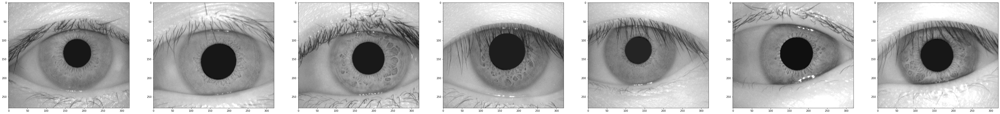

In [40]:
n = 7
plot_image_sequence(iris_images, n)

### 2. Biometric iris recogntion System
#### 2.1. Image enhancement
Similar to the image enhancement in the [fingerprints](#3.1.-Image-enhancements) section, we will use [open source code](https://github.com/thuyngch/Iris-Recognition) to segment (based on Daugman's intefro-differential) and normalise (by unwraping the circular region) the iris images. We strongly encourage you to go through the source code or github repository to learn more. 

Also similar to the fingerprint section we enhance the images using a gabor filter bank, this time we implement this using [OpenCV](https://docs.opencv.org/3.4/d4/d86/group__imgproc__filter.html#gae84c92d248183bd92fa713ce51cc3599). 

In [41]:
import warnings
warnings.filterwarnings('ignore')

from src.irismodules.iris_recognition.python.fnc import segment, normalize

# we use the same hyper parameters as in the enroll-casia1.py example
# feel free to play around with these!
eyelashes_thres = 150
radial_res = 200
angular_res = 500

def segment_iris(img):
    # Segment the iris region from the eye image. Indicate the noise region.
    ciriris, cirpupil, imwithnoise = segment.segment(img)

    # Normalize iris region by unwraping the circular region into a rectangular block of constant dimensions.
    polar_iris, mask = normalize.normalize(
        imwithnoise, ciriris[1], ciriris[0], ciriris[2], cirpupil[1], cirpupil[0], cirpupil[2], radial_res, angular_res)
    
    return polar_iris, (mask == 0)      

def get_filter_bank(ksize = 5,sigma = 4, theta_range = np.arange(0,np.pi,np.pi/16), lambd=10,gamma = 0.5,psi=0 ):
    # this filterbank comes from https://cvtuts.wordpress.com/
    filters = []
    for theta in theta_range:
        kern = cv2.getGaborKernel((ksize, ksize), sigma, theta, lambd, gamma, psi, ktype=cv2.CV_32F)
        kern /= 1.5*kern.sum()
        filters.append(kern)
    return filters
    cv2.getGaborKernel()
    
def enhance_iris(img, eps = 1.e-15, agg_f = np.max):
    # get the gabor filters
    filters = get_filter_bank()
    # apply filters to image
    enhanced_image = np.array([cv2.filter2D(img, ddepth = -1, kernel=k) for k in filters])
    # Normalize in the [0,255] range
    enhanced_image = cv2.normalize(enhanced_image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=0)
    # aggregate features
    return agg_f(enhanced_image,0)
    
def enhance_and_segment_irises(images):
    enhanced_images, masks = [], []
    for img in tqdm_notebook(images):
        normalised_img, mask = segment_iris(img)
        enhanced_img = enhance_iris(normalised_img)
        
        masks.append(mask)
        enhanced_images.append(enhanced_img)
    
    return np.array(enhanced_images), np.array(masks)

try:
    with open("iris_mask_db.pkl","rb") as f:
        enhanced_iris,mask_iris = pickle.load(f)
except:
    enhanced_iris, mask_iris = enhance_and_segment_irises(iris_images)
    with open("iris_mask_db.pkl","wb") as f:
        pickle.dump([enhanced_iris,mask_iris],f)

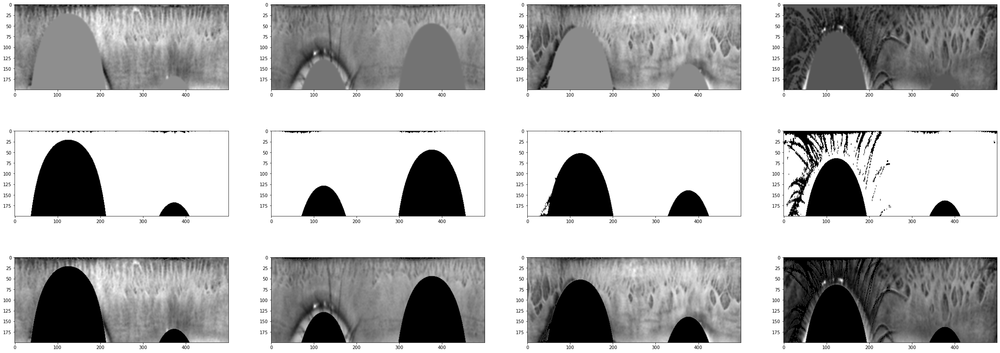

In [42]:
n=4

iris_segmented_db = np.array([a*b for a,b in zip(enhanced_iris, mask_iris)])
plot_image_sequence(enhanced_iris.tolist()[:n] + mask_iris.tolist()[:n] + iris_segmented_db.tolist()[:n], 3*n, n, figsize= (10,5), cmap='gray')

<div class="alert alert-block alert-success">
<b>Q7: </b> Construct a similarity table with the iris images. Use local OR global matches in order to get scores. Use the scores you get to determine the perpetrator.
</div>

  0%|          | 0/1 [00:00<?, ?it/s]

Knee at: 14	 Treshold:  0.08675799086757992


,id,score
35,036,87.6
62,063,84.4
24,025,70.2
92,093,56.4
90,091,56.4
...,...,...
30,031,0.0
93,094,0.0
40,041,0.0
66,067,0.0


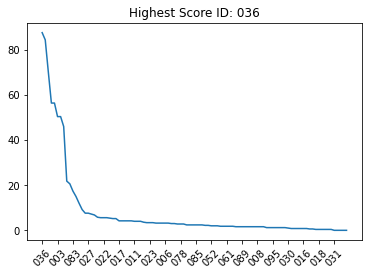

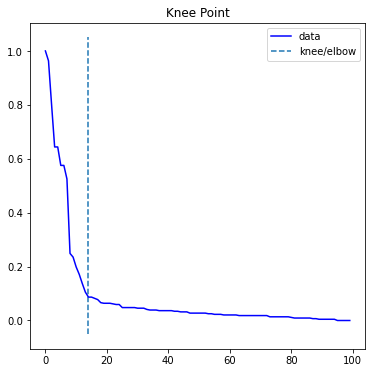

In [43]:
iris_perpetrator_enhanced, iris_perpetrator_mask = enhance_and_segment_irises([iris_perpetrator])
iris_perpetrator_enhanced = iris_perpetrator_enhanced[0]
iris_perpetrator_mask = iris_perpetrator_mask[0]

#sim_tb1 = constructSimilarityTable(np.stack((perp_img_en,perp_img_mask),-1), np.stack((images_segmented_db,masks_db),-1), labels_db, local_similarity)
sim_tb4 = constructSimilarityTable(np.stack((iris_perpetrator_enhanced,iris_perpetrator_mask),-1), np.stack((enhanced_iris,mask_iris),-1), iris_labels, hybrid_similarity)

sim_tb4 = sim_tb4.sort_values(by='score', ascending=False)
ids_4,scores_4 = sim_tb4.values[:,0],sim_tb4.values[:,1]
plt.plot(ids_4,scores_4)
plt.xticks(np.arange(0,100,5),ids_4[np.arange(0,100,5)],rotation = 45)
plt.title('Highest Score ID: '+ids_4[0]);

scores_hybrid = (scores_4 - scores_4.min()) / (scores_4.max() - scores_4.min())

kneedle4 = KneeLocator(list(range(len(ids_4))),scores_hybrid,S=1, curve='convex', direction='decreasing')
print(f'Knee at: {kneedle4.knee}\t Treshold: ',kneedle4.knee_y)
kneedle4.plot_knee()

# Display the similarity 
sim_tb4

How is this possible? Iris scans don't provide a clear suspect either. 

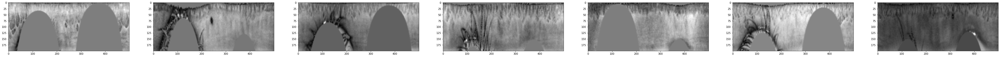

In [45]:
def get_iris_image_by_label(ind):
    for i in range(len(iris_labels)):
        if iris_labels[i] == ind:
            return enhanced_iris[i]
    raise ValueError("No image with this label is found.")

imgs = [get_iris_image_by_label(i) for i in ids[:kneedle.knee]]

plot_image_sequence(imgs,kneedle.knee if kneedle.knee<=7 else 7)

They are all the same once again. There is no doubt about it now, there is an insider messing with the data! Lucky for us, but unlucky for them, they slipped up. We can now construct a multimodal biometric system in order to catch the perpetrator.

## IV Multimodal System

<div class="alert alert-block alert-success">
<b>Q8: </b> Fuse your iris and fingerprint biometric system on the score level to solve the murder case! Do you feel confident in your prediction? How do you fuse the scores? Why?
</div>

The process of fusing the iris and fingerprint biometric system on the score level is explained below:
the hybrid similarity metric is used to calculate the fingerprint and iris similarity score between each pair suspect image/perpetrator image, 
Afterwards, the scores are added, forming a weighted sum that consists the fused similarity metric.

The result depends on the threshold definition when configuring the local similarity metric, the global similarity metric as well as in the weights chosen in the hybrid similarity metric.
The best configuration of weights can be considered an optimization problem given that we know which suspect from the database is the perpetrator.

In [46]:
#def hybrid_similarity(masked_fp1, masked_fp2, detector=cv2.ORB_create(), kp_erosion_ksize = (5,5)):
    
# 1 : perpetrator
# 2 : suspect

def constructSimilarityTable2(org_img1,img_db1,org_img2,img_db2, labels, dist_func):
    #dist_func is the function that computes the distance between two images (distance_function)
    data=[]
    dist1 = []
    dist2 = []
    fused_distance = []
    
    for i,img1 in enumerate(img_db1):
        dist1.append(dist_func(org_img1, img1))

    for j,img2 in enumerate(img_db2):
        dist2.append(dist_func(org_img2, img2))

    for j,img2 in enumerate(img_db2):
        fused_distance.append(dist1[j] + dist2[j])

    for j,img2 in enumerate(img_db2):
        data.append([
            labels[j],
            fused_distance[j]])
    assert (len(data) == len(img_db1))
    return pd.DataFrame(data, columns=['id', 'score'])

#--------------------------------------------------------------
def fused_similarity(masked_fp1, masked_fp2,masked_iris1, masked_iris2, detector=cv2.ORB_create(), kp_erosion_ksize = (5,5)):
    fp_wght  = 0.5
    iris_wght  = 0.2
    
    fp_similarity_score = hybrid_similarity(masked_fp1, masked_fp2, detector=cv2.ORB_create(), kp_erosion_ksize = (5,5))
    iris_similarity_score = hybrid_similarity(masked_iris1, masked_iris2, detector=cv2.ORB_create(), kp_erosion_ksize = (5,5))
    
    fused_similarity_score = fp_wght*fp_similarity_score + iris_wght*iris_similarity_score

    return fused_similarity_score


# Testing the fused_similarity function
masked_fp1 = np.stack((images_segmented_db[0],masks_db[0]),-1) 
masked_fp2 = np.stack((images_segmented_db[0],masks_db[0]),-1)

masked_iris1 = np.stack((enhanced_iris[0],mask_iris[0]),-1) 
masked_iris2 = np.stack((enhanced_iris[0],mask_iris[0]),-1) 

# example of using an image to create a merged features descriptor for the first suspect in the database
#masked_fp0 = np.stack((images_segmented_db[0],masks_db[0]),-1)
#masked_iris0 = np.stack((enhanced_iris[0],mask_iris[0]),-1) 

# perpetrator's fingerprint and iris data
#masked_fp_perp = np.stack((perp_img_en,perp_img_mask),-1)
#masked_iris_perp = np.stack((iris_perpetrator_enhanced,iris_perpetrator_mask),-1)

fused_similarity_score = fused_similarity(masked_fp1, masked_fp2,masked_iris1, masked_iris2, detector=cv2.ORB_create(), kp_erosion_ksize = (5,5))

In [47]:
sim_tb5 = constructSimilarityTable2(np.stack((perp_img_en,perp_img_mask),-1), np.stack((images_segmented_db,masks_db),-1),np.stack((iris_perpetrator_enhanced,iris_perpetrator_mask),-1), np.stack((enhanced_iris,mask_iris),-1), iris_labels, hybrid_similarity)

sim_tb5 = sim_tb5.sort_values(by='score', ascending=False)

In [48]:
print("Similarity scores between suspects ad perpetrator based on fused fingerprint and iris hybrid scores")
sim_tb5

Similarity scores between suspects ad perpetrator based on fused fingerprint and iris hybrid scores


,id,score
35,036,88.4
62,063,87.2
55,056,78.4
24,025,75.4
92,093,63.4
...,...,...
4,005,2.8
80,081,2.8
31,032,2.6
93,094,1.6


### Task I/Task 9. [MULTI] Fuse your modalities on the feature level instead of the score level (3pt) 

Feature descriptor from fingerprints + Feature descriptor from irises = merged feature vector 
1 merged feature vector for each suspect
1 merged feature vector for the perpetrator
		
Similarity measure between the suspect vectors and the perpetrator's
Highest similarity shows which suspect is the perpetrator.  

In [49]:
def extract_and_merge_features(masked_fp,masked_iris,detector,kp_erosion_ksize):
    # separate the segmentation from the fingerprint image
    fp_img, mask1 = masked_fp[...,0],masked_fp[...,1] 
    # detect the keypoints on the fingerprint image
    kp_fp = detect_keypoints(fp_img, mask1, detector, kernel_size = kp_erosion_ksize)
    # compute descriptor for the fingerprint image
    kp_fp, local_descriptor_fp = compute_local_descriptor(fp_img, kp_fp, detector)
    # Display descriptor information
    # print("local_descriptor_fingerprint shape: ",np.shape(local_descriptor_fp))

    # separate the segmentation from the iris image
    iris_img, mask2 = masked_iris[...,0],masked_iris[...,1] 
    # detect the keypoints on the iris image
    kp_iris = detect_keypoints(iris_img, mask2, detector, kernel_size = kp_erosion_ksize)
    # compute descriptor for the iris image
    kp_iris, local_descriptor_iris = compute_local_descriptor(iris_img, kp_iris, detector)
    # Display descriptor information
    # print("local_descriptor_iris shape: ",np.shape(local_descriptor_iris),"\n")

    # flatten descriptors
    local_des_fp_flat = local_descriptor_fp.flatten()
    # print("local_descriptor_fingerprint_flattened shape: ",np.shape(local_des_fp_flat))
    local_des_iris_flat = local_descriptor_iris.flatten()
    # print("local_descriptor_iris_flattened shape: ",np.shape(local_des_iris_flat))

    merged_descriptor = np.concatenate((local_des_fp_flat, local_des_iris_flat), axis=None)
    # print("merged_descriptor shape: ",np.shape(merged_descriptor))

    return  merged_descriptor

######################################################################
# TESTING THE extract_and_merge_features FUNCTION
detector = cv2.ORB_create()
kp_erosion_ksize = (5,5)

# example of using an image to create a merged features descriptor for the first suspect in the database
masked_fp0 = np.stack((images_segmented_db[0],masks_db[0]),-1)
masked_iris0 = np.stack((enhanced_iris[0],mask_iris[0]),-1) 

# perpetrator's fingerprint and iris data
masked_fp_perp = np.stack((perp_img_en,perp_img_mask),-1)
masked_iris_perp = np.stack((iris_perpetrator_enhanced,iris_perpetrator_mask),-1)

# extract merged features descriptor for the first suspect in the database
merged_descriptor0 = extract_and_merge_features(masked_fp0,masked_iris0,detector,kp_erosion_ksize)

# extract merged features descriptor for the perpetrator
merged_descriptor_perp = extract_and_merge_features(masked_fp_perp,masked_iris_perp,detector,kp_erosion_ksize)
